<a href="https://colab.research.google.com/github/Camves/Pred_Temperatura_Motor_Eletrico/blob/main/Analise_temperatura_rotor.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **IMPORTANDO BIBLIOTECAS BÁSICAS**

In [ ]:
!pip -q install plotly

In [ ]:
!pip -q install yellowbrick

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

# **BASE DE DADOS - TEMPERATURA DE MOTORES ELÉTRICOS**

- Fonte: https://www.kaggle.com/datasets/wkirgsn/electric-motor-temperature

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### **EXPLORAÇÃO DOS DADOS**

In [ ]:
!unzip /content/drive/MyDrive/colheta/motores.zip

Archive:  /content/drive/MyDrive/colheta/motores.zip
  inflating: measures_v2.csv         


In [ ]:
base_motores = pd.read_csv('/content/measures_v2.csv')

In [ ]:
base_motores

,u_q,coolant,stator_winding,u_d,stator_tooth,motor_speed,i_d,i_q,pm,stator_yoke,ambient,torque,profile_id
0,-0.450682,18.805172,19.086670,-0.350055,18.293219,0.002866,0.004419,0.000328,24.554214,18.316547,19.850691,1.871008e-01,17
1,-0.325737,18.818571,19.092390,-0.305803,18.294807,0.000257,0.000606,-0.000785,24.538078,18.314955,19.850672,2.454175e-01,17
2,-0.440864,18.828770,19.089380,-0.372503,18.294094,0.002355,0.001290,0.000386,24.544693,18.326307,19.850657,1.766153e-01,17
3,-0.327026,18.835567,19.083031,-0.316199,18.292542,0.006105,0.000026,0.002046,24.554018,18.330833,19.850647,2.383027e-01,17
4,-0.471150,18.857033,19.082525,-0.332272,18.291428,0.003133,-0.064317,0.037184,24.565397,18.326662,19.850639,2.081967e-01,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1330811,-2.152128,30.721298,45.274497,0.791801,41.934347,0.000380,-2.000169,1.097528,62.147780,38.653720,23.989078,-8.116730e-60,71
1330812,-2.258684,30.721306,45.239017,0.778900,41.868923,0.002985,-2.000499,1.097569,62.142646,38.656328,23.970700,-5.815891e-60,71
1330813,-2.130312,30.721312,45.211576,0.804914,41.804819,0.002301,-1.999268,1.098765,62.138387,38.650923,23.977234,-4.167268e-60,71
1330814,-2.268498,30.721316,45.193508,0.763091,41.762220,0.005662,-2.000999,1.095696,62.133422,38.655686,24.001421,-2.985978e-60,71


In [ ]:
base_motores.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1330816 entries, 0 to 1330815
Data columns (total 13 columns):
 #   Column          Non-Null Count    Dtype  
---  ------          --------------    -----  
 0   u_q             1330816 non-null  float64
 1   coolant         1330816 non-null  float64
 2   stator_winding  1330816 non-null  float64
 3   u_d             1330816 non-null  float64
 4   stator_tooth    1330816 non-null  float64
 5   motor_speed     1330816 non-null  float64
 6   i_d             1330816 non-null  float64
 7   i_q             1330816 non-null  float64
 8   pm              1330816 non-null  float64
 9   stator_yoke     1330816 non-null  float64
 10  ambient         1330816 non-null  float64
 11  torque          1330816 non-null  float64
 12  profile_id      1330816 non-null  int64  
dtypes: float64(12), int64(1)
memory usage: 132.0 MB


In [ ]:
base_motores.describe()

,u_q,coolant,stator_winding,u_d,stator_tooth,motor_speed,i_d,i_q,pm,stator_yoke,ambient,torque,profile_id
count,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06
mean,5.427900e+01,3.622999e+01,6.634275e+01,-2.513381e+01,5.687858e+01,2.202081e+03,-6.871681e+01,3.741278e+01,5.850678e+01,4.818796e+01,2.456526e+01,3.110603e+01,4.079306e+01
std,4.417323e+01,2.178615e+01,2.867206e+01,6.309197e+01,2.295223e+01,1.859663e+03,6.493323e+01,9.218188e+01,1.900150e+01,1.999100e+01,1.929522e+00,7.713575e+01,2.504549e+01
min,-2.529093e+01,1.062375e+01,1.858582e+01,-1.315304e+02,1.813398e+01,-2.755491e+02,-2.780036e+02,-2.934268e+02,2.085696e+01,1.807669e+01,8.783478e+00,-2.464667e+02,2.000000e+00
25%,1.206992e+01,1.869814e+01,4.278796e+01,-7.869090e+01,3.841601e+01,3.171107e+02,-1.154061e+02,1.095863e+00,4.315158e+01,3.199033e+01,2.318480e+01,-1.374265e-01,1.700000e+01
50%,4.893818e+01,2.690014e+01,6.511013e+01,-7.429755e+00,5.603635e+01,1.999977e+03,-5.109376e+01,1.577401e+01,6.026629e+01,4.562551e+01,2.479733e+01,1.086035e+01,4.300000e+01
75%,9.003439e+01,4.985749e+01,8.814114e+01,1.470271e+00,7.558668e+01,3.760639e+03,-2.979688e+00,1.006121e+02,7.200837e+01,6.146083e+01,2.621702e+01,9.159718e+01,6.500000e+01
max,1.330370e+02,1.015985e+02,1.413629e+02,1.314698e+02,1.119464e+02,6.000015e+03,5.189670e-02,3.017079e+02,1.136066e+02,1.011480e+02,3.071420e+01,2.610057e+02,8.100000e+01





# **PREPARAÇÃO DOS DADOS**

Inicialmente, removemos a coluna "profile_id", pois esta não contém dados interessantes para a nossa análise.

In [ ]:
#base_motores2 = base_motores.drop('i_q', axis = 1)
#base_motores2 = base_motores2.drop('u_q', axis = 1)
#base_motores2 = base_motores2.drop('i_d', axis = 1)
#base_motores2 = base_motores2.drop('u_d', axis = 1)
base_motores2 = base_motores.drop('profile_id', axis = 1)

Através da plotagem de histogramas e dos boxplots, podemos buscar os outliers, para assim, podermos remove-los.

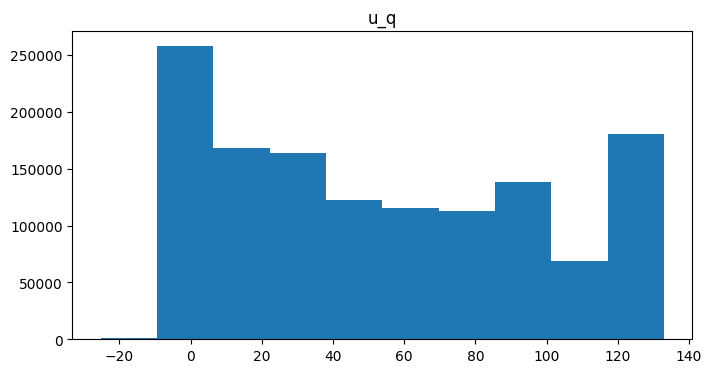

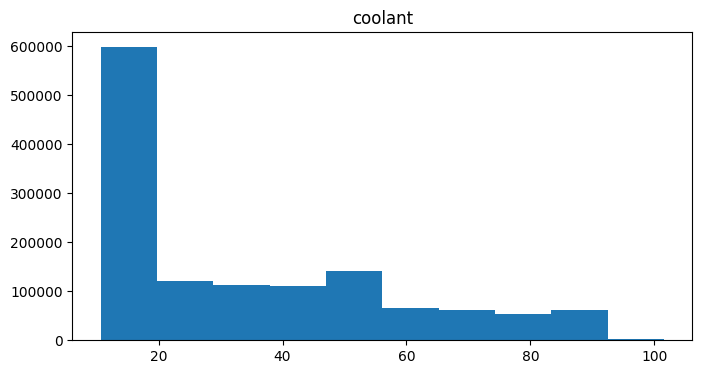

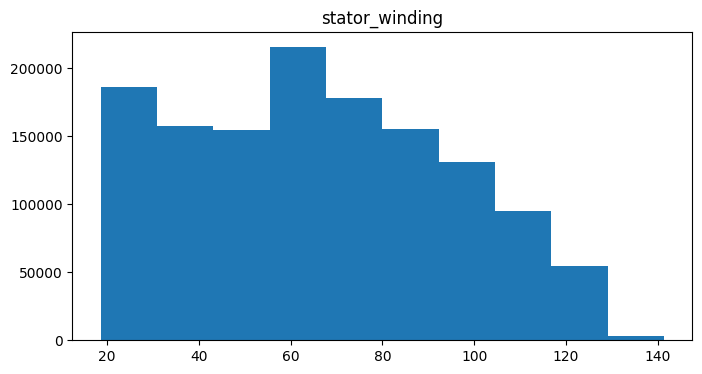

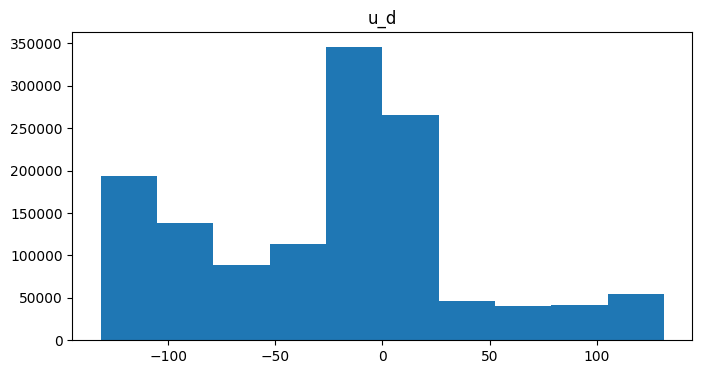

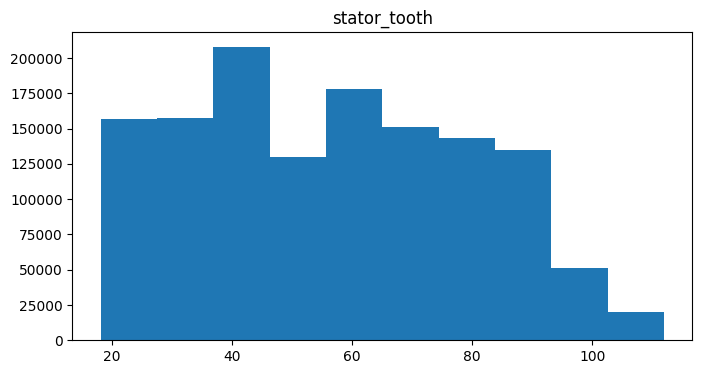

...

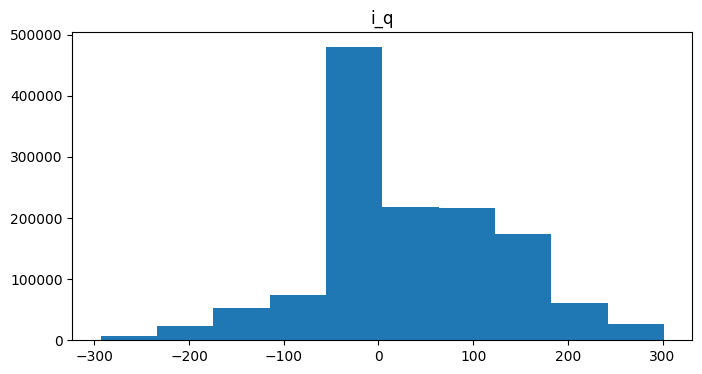

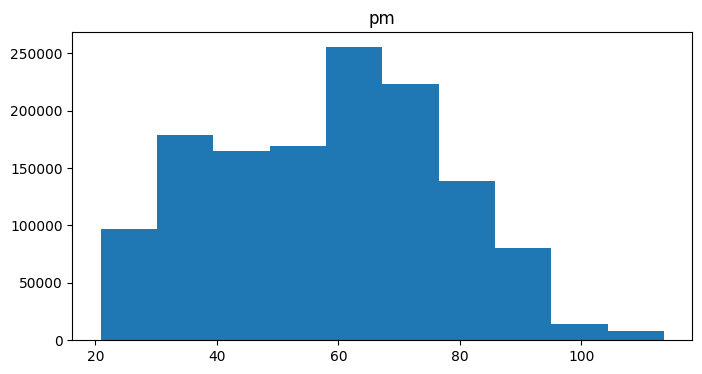

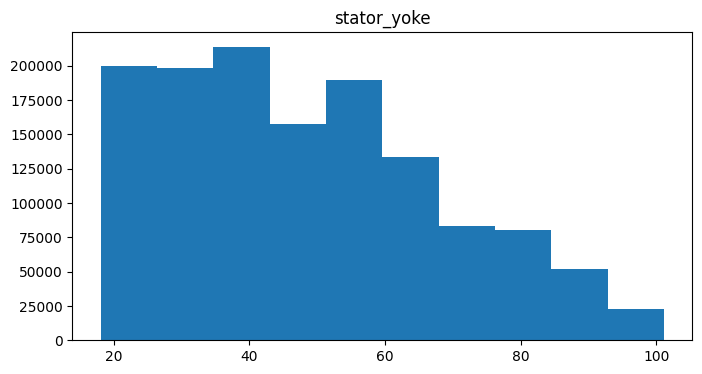

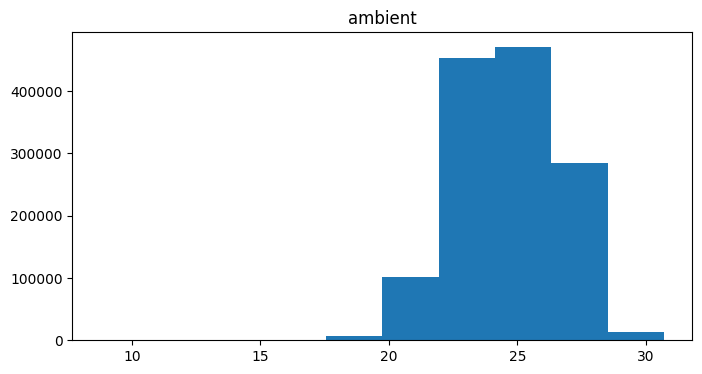

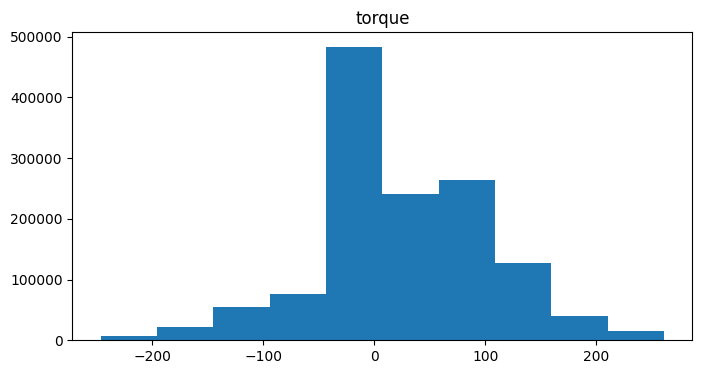

In [ ]:
for col_name in base_motores2.columns:
  plt.figure(figsize=(8, 4))
  plt.hist(base_motores2[col_name])
  plt.title(col_name)
  plt.show()

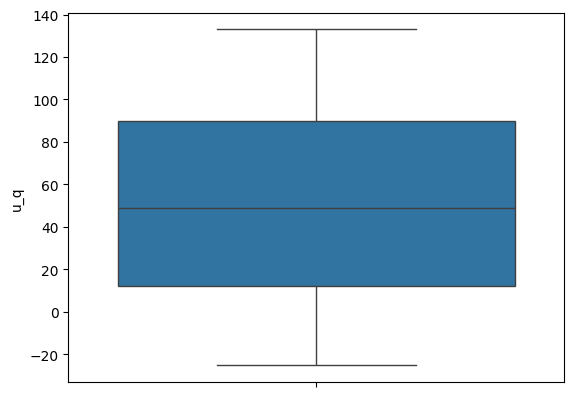

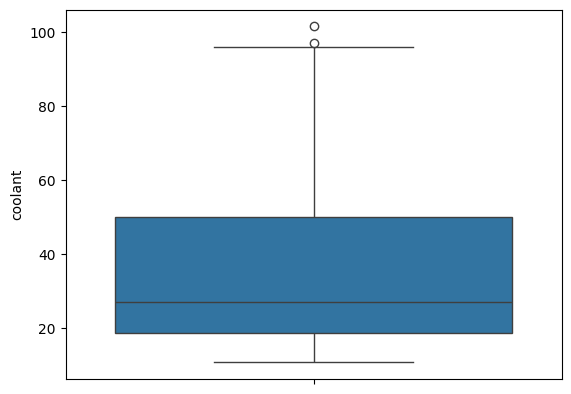

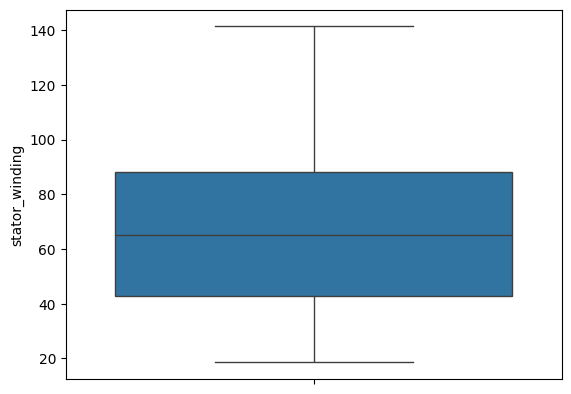

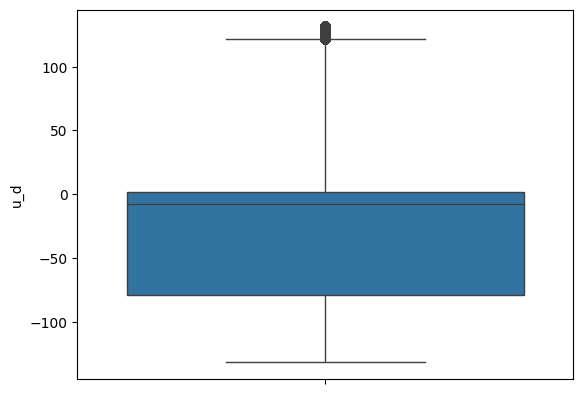

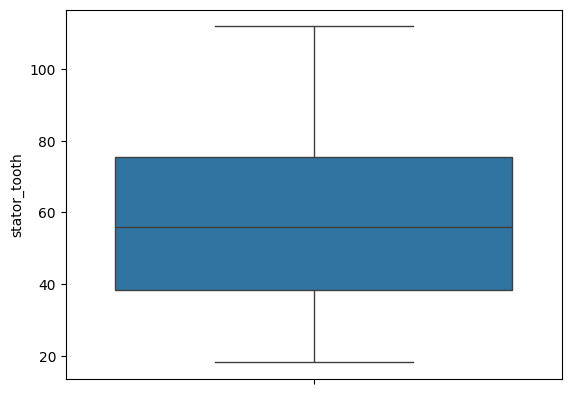

...

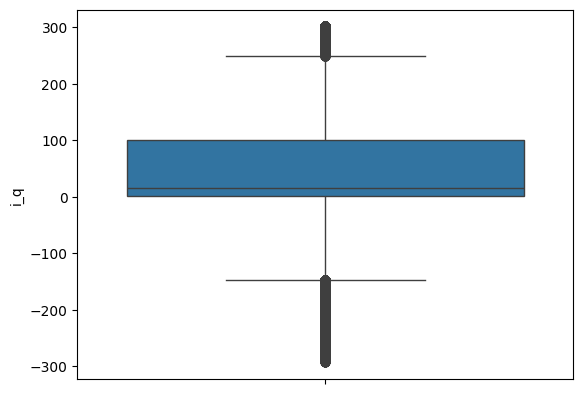

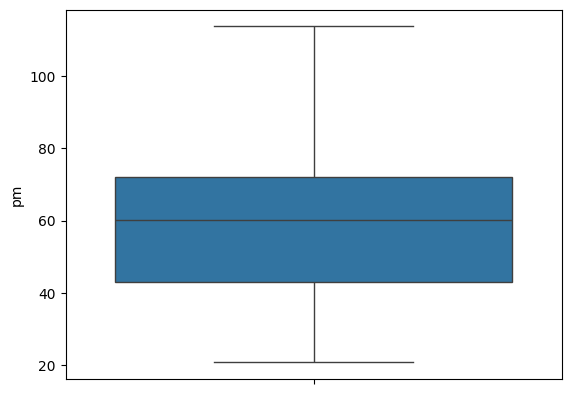

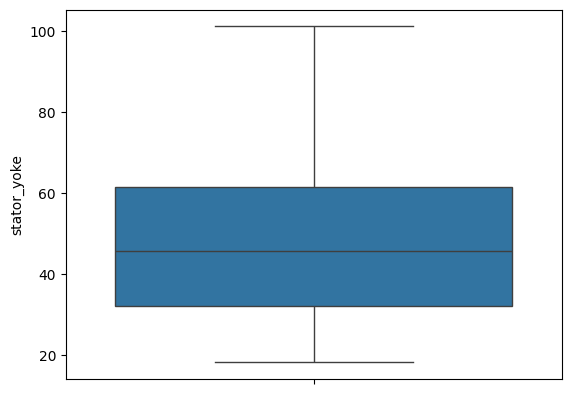

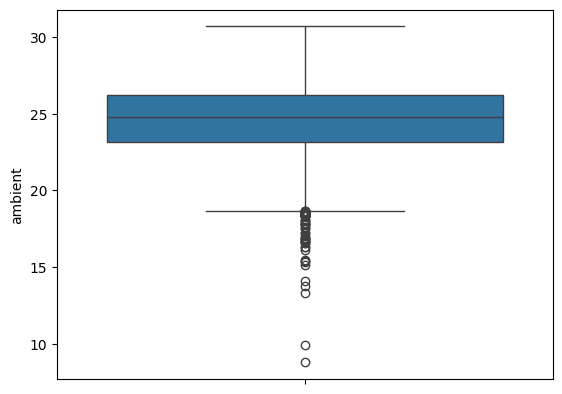

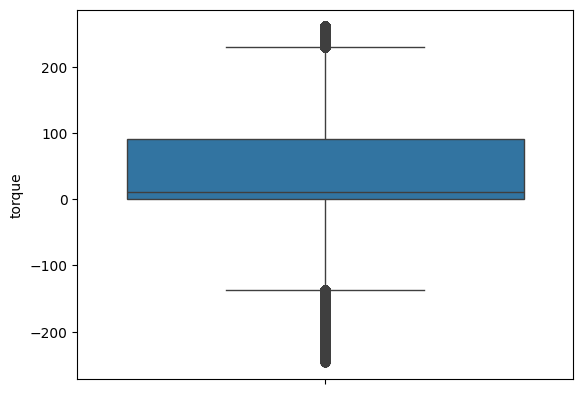

In [ ]:
for col_name in base_motores2.columns:
  sns.boxplot(y = col_name, data = base_motores2)
  plt.show()

Logo abaixo, removemos os outliers encontrados nas plotagens.

In [ ]:
# Apagar somente os registros com valores inconsistentes
base_motores2 = base_motores2.drop(base_motores2[base_motores2['torque'] < -100].index)
base_motores2 = base_motores2.drop(base_motores2[base_motores2['torque'] > 220].index)
base_motores2 = base_motores2.drop(base_motores2[base_motores2['ambient'] < 19].index)
base_motores2 = base_motores2.drop(base_motores2[base_motores2['stator_winding'] > 120].index)
base_motores2 = base_motores2.drop(base_motores2[base_motores2['pm'] > 110].index)
base_motores2 = base_motores2.drop(base_motores2[base_motores2['coolant'] > 96].index)
base_motores2 = base_motores2.drop(base_motores2[base_motores2['u_d'] > 60].index)
base_motores2 = base_motores2.drop(base_motores2[base_motores2['i_d'] < -160].index)
base_motores2 = base_motores2.drop(base_motores2[base_motores2['i_q'] > 200].index)
base_motores2 = base_motores2.drop(base_motores2[base_motores2['i_q'] < -100].index)
base_motores2

,u_q,coolant,stator_winding,u_d,stator_tooth,motor_speed,i_d,i_q,pm,stator_yoke,ambient,torque
0,-0.450682,18.805172,19.086670,-0.350055,18.293219,0.002866,0.004419,0.000328,24.554214,18.316547,19.850691,1.871008e-01
1,-0.325737,18.818571,19.092390,-0.305803,18.294807,0.000257,0.000606,-0.000785,24.538078,18.314955,19.850672,2.454175e-01
2,-0.440864,18.828770,19.089380,-0.372503,18.294094,0.002355,0.001290,0.000386,24.544693,18.326307,19.850657,1.766153e-01
3,-0.327026,18.835567,19.083031,-0.316199,18.292542,0.006105,0.000026,0.002046,24.554018,18.330833,19.850647,2.383027e-01
4,-0.471150,18.857033,19.082525,-0.332272,18.291428,0.003133,-0.064317,0.037184,24.565397,18.326662,19.850639,2.081967e-01
...,...,...,...,...,...,...,...,...,...,...,...,...
1330811,-2.152128,30.721298,45.274497,0.791801,41.934347,0.000380,-2.000169,1.097528,62.147780,38.653720,23.989078,-8.116730e-60
1330812,-2.258684,30.721306,45.239017,0.778900,41.868923,0.002985,-2.000499,1.097569,62.142646,38.656328,23.970700,-5.815891e-60
1330813,-2.130312,30.721312,45.211576,0.804914,41.804819,0.002301,-1.999268,1.098765,62.138387,38.650923,23.977234,-4.167268e-60
1330814,-2.268498,30.721316,45.193508,0.763091,41.762220,0.005662,-2.000999,1.095696,62.133422,38.655686,24.001421,-2.985978e-60


Podemos verificar uma melhora na distribuição dos dados apresentados, após os ajustes.

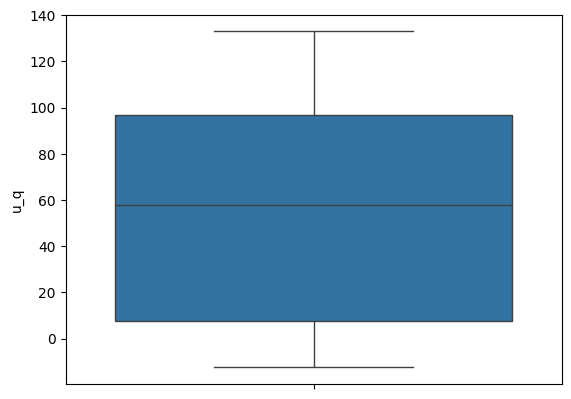

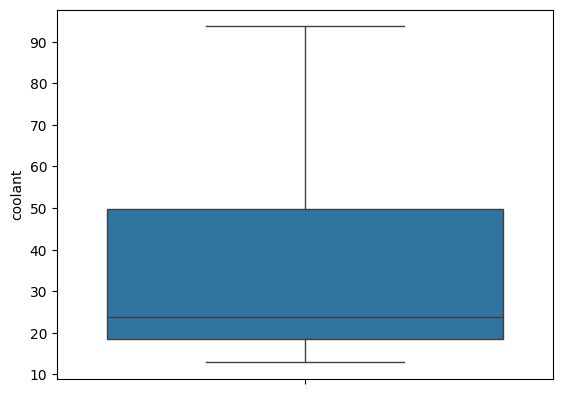

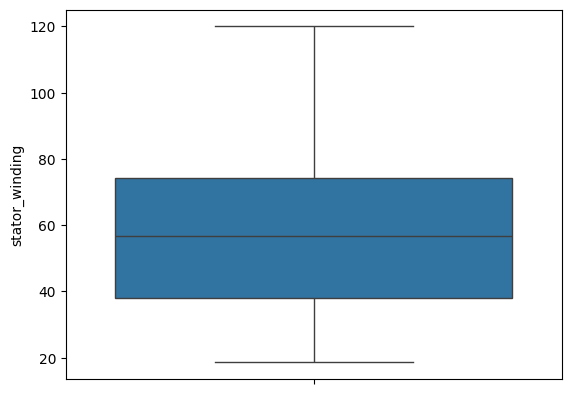

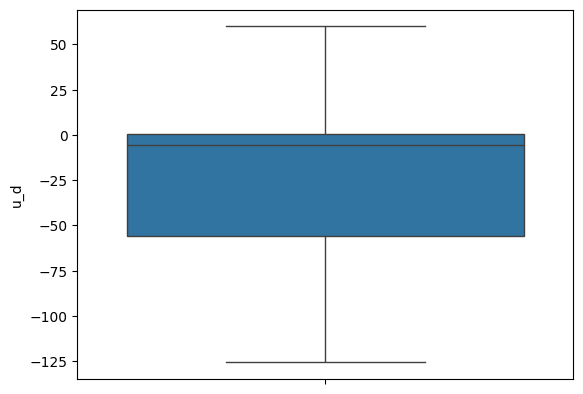

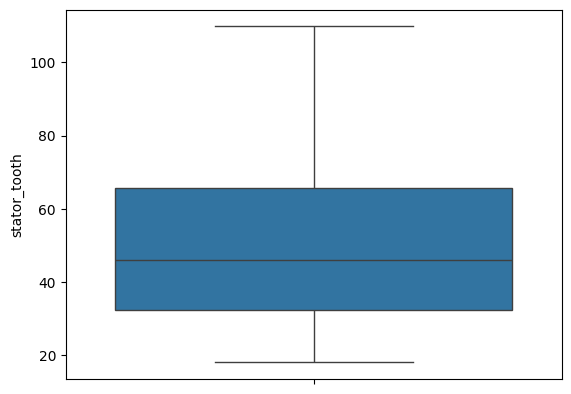

...

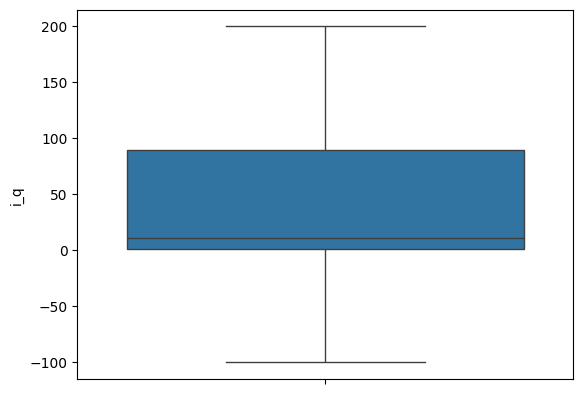

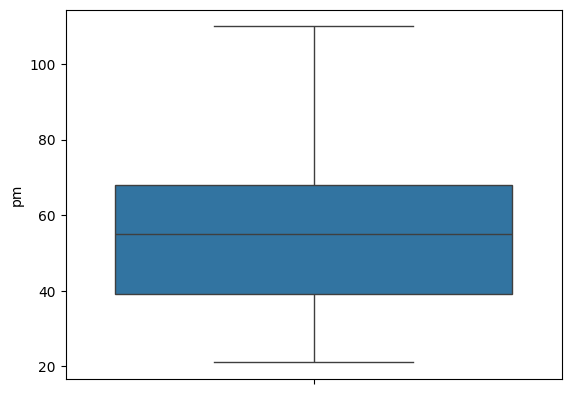

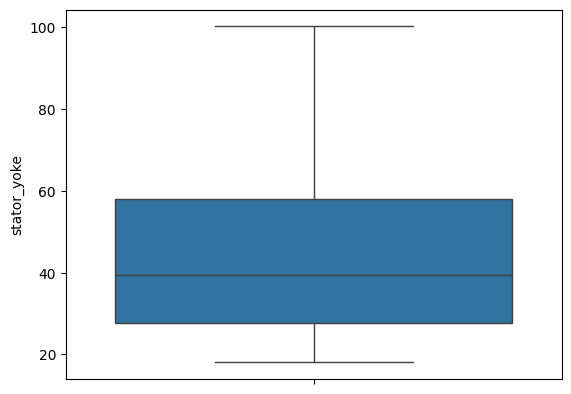

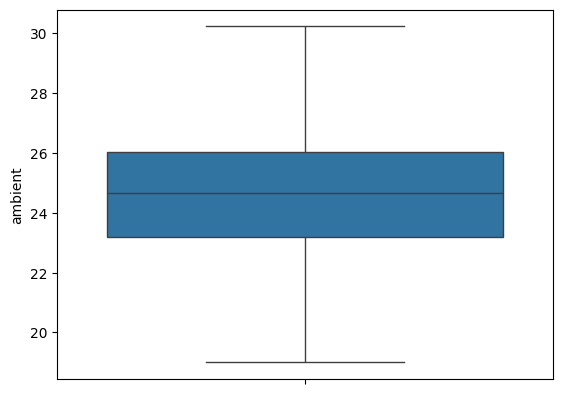

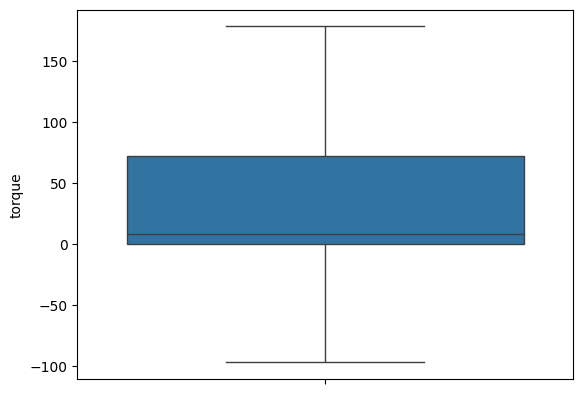

In [ ]:
for col_name in base_motores2.columns:
  sns.boxplot(y = col_name, data = base_motores2)
  plt.show()

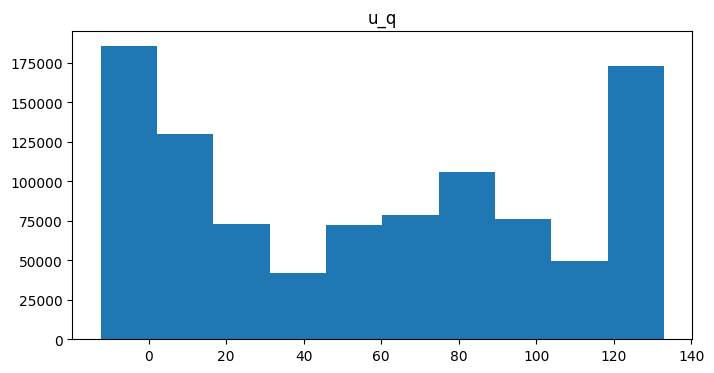

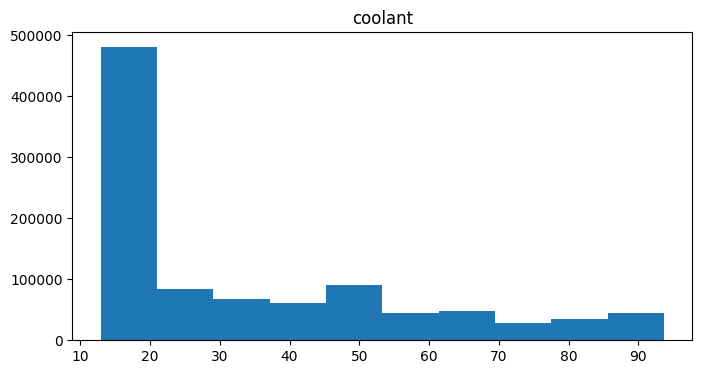

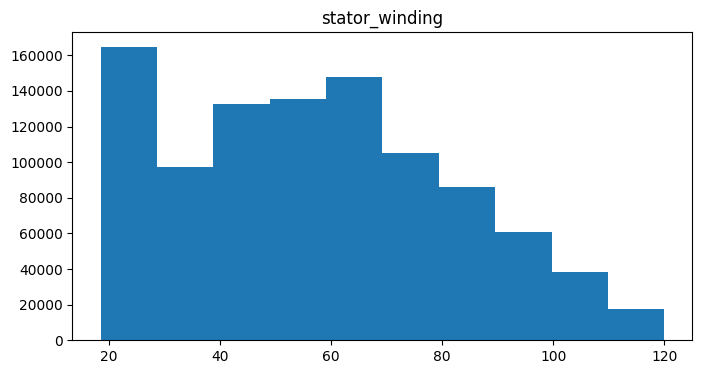

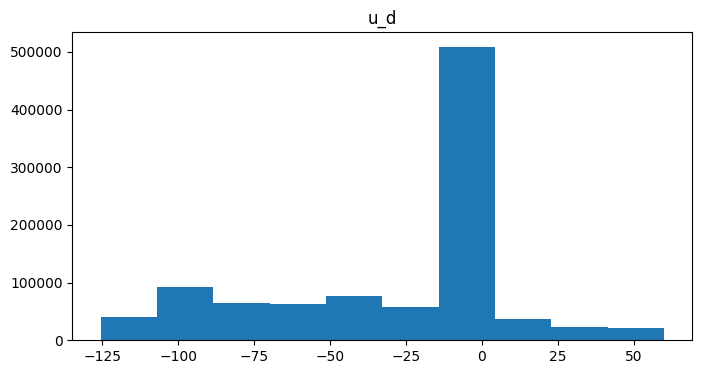

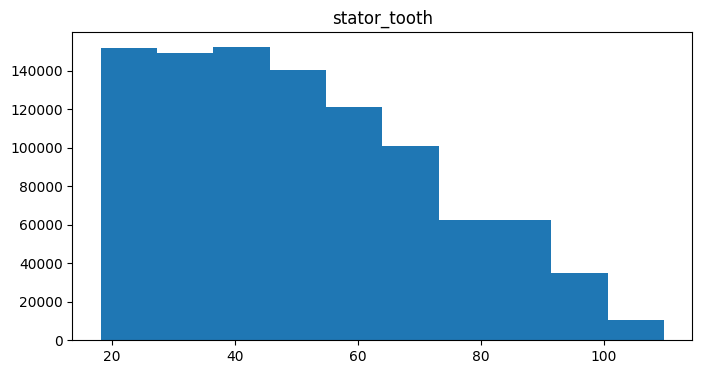

...

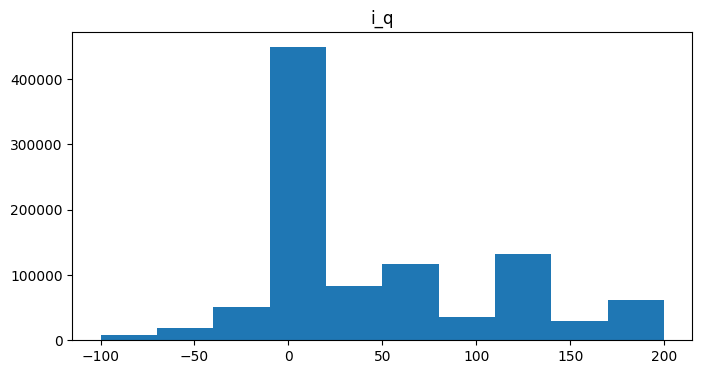

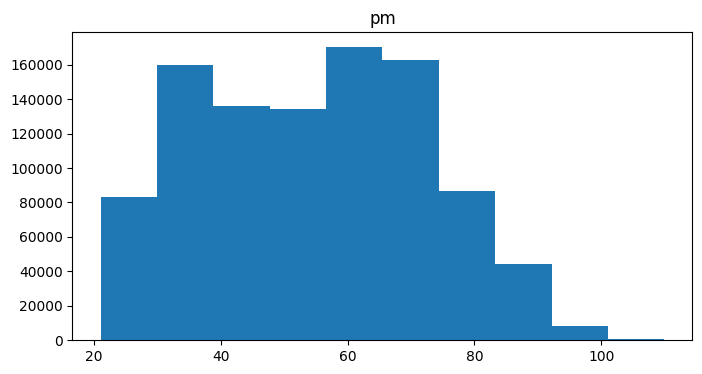

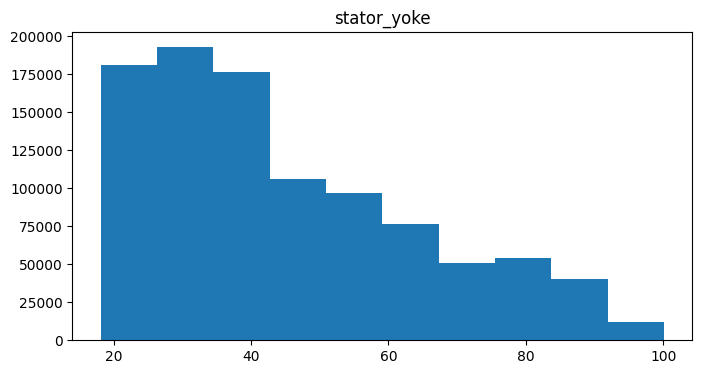

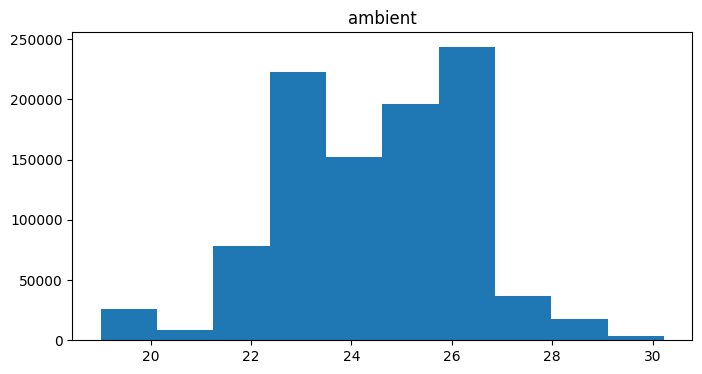

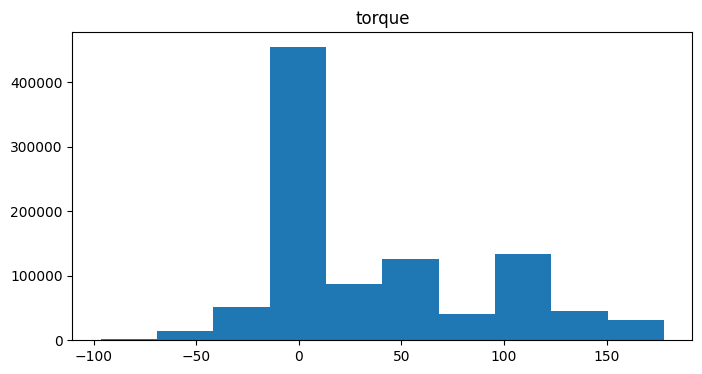

In [ ]:
for col_name in base_motores2.columns:
  plt.figure(figsize=(8, 4))
  plt.hist(base_motores2[col_name])
  plt.title(col_name)
  plt.show()

# **ANÁLISE BIVARIADA**

Foi realizada uma plotagem dos gráficos de disperção, para possibilitar uma visualização da correlação das variáveis.

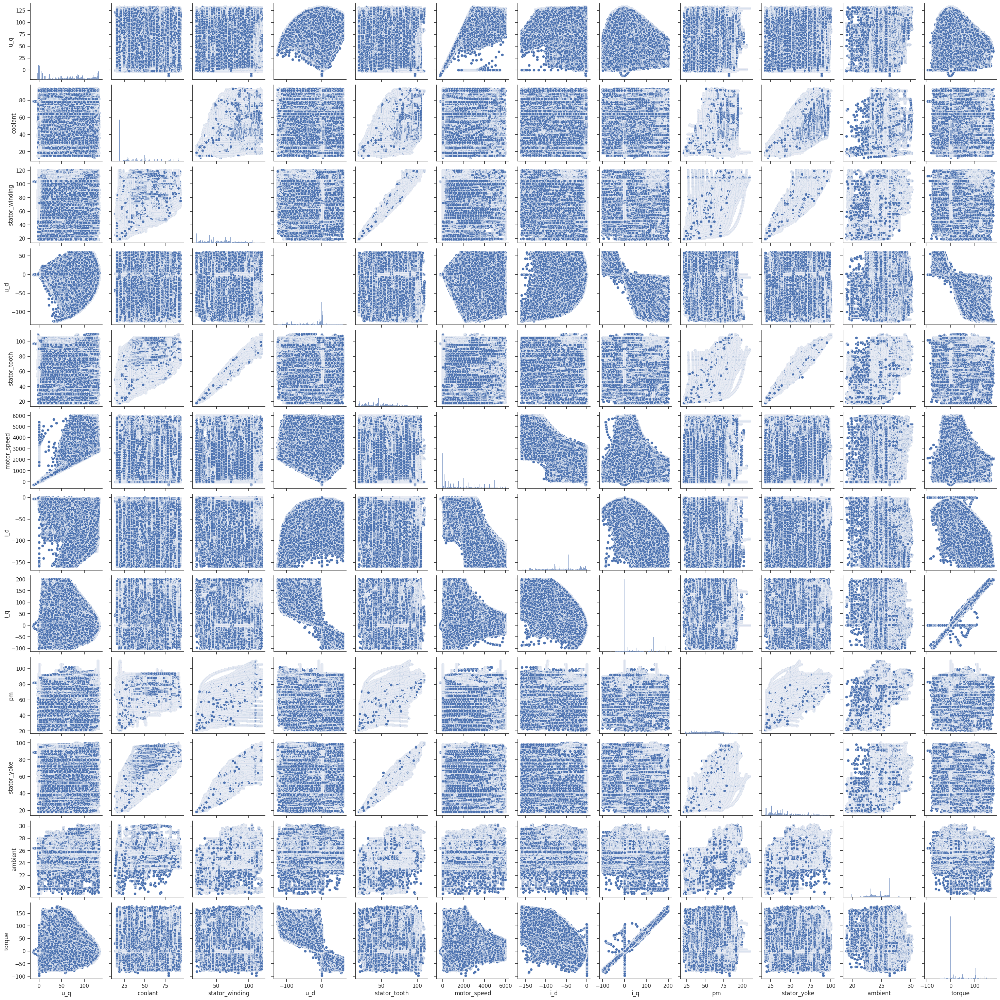

In [ ]:
import seaborn as sns
sns.set_theme(style="ticks")

sns.pairplot(base_motores2)




# **ANÁLISE ESTATÍSTICA AVANÇADA**

Inicialmente foi realizado um teste de hipóteses para a análise da significância da diferença estatística entre as variáveis.

In [ ]:
import numpy as np
from scipy import stats
for col_name in base_motores2.columns:
  for col_name2 in base_motores2.columns:
    if col_name2 != col_name:
      t_stat, p_value = stats.ttest_ind(base_motores2[col_name], base_motores2[col_name2])
      if p_value > 0.05:
        print(f"T-statistic: {t_stat:.2f}" + " " + str(col_name)+ " X " + str(col_name2))
        print(f"P-value: {p_value:.4f}" + " " + str(col_name)+ " X " + str(col_name2))



Em seguida foi realizada uma análise de variância para verificarmos se há diferenças significativas entre as médias.

In [ ]:
import pandas as pd
from scipy import stats
import statsmodels.api as sm
from statsmodels.formula.api import ols

for col_name in base_motores2.columns:
  for col_name2 in base_motores2.columns:
    if col_name2 != col_name:
      # Ajustando o modelo ANOVA
      modelo = ols(str(col_name2) + ' ~ ' + str(col_name), data=base_motores2).fit()

      # Tabela ANOVA
      anova_table = sm.stats.anova_lm(modelo, typ=2)
      print("  ")
      print(str(col_name)+ " X " + str(col_name2))
      print(anova_table)
      print("  ")

  
u_q X coolant
                sum_sq        df         F    PR(>F)
u_q       1.979882e+03       1.0  4.154964  0.041513
Residual  4.697593e+08  985833.0       NaN       NaN
  
  
u_q X stator_winding
                sum_sq        df             F  PR(>F)
u_q       3.974764e+07       1.0  69553.509361     0.0
Residual  5.633725e+08  985833.0           NaN     NaN
  
  
u_q X u_d
                sum_sq        df             F  PR(>F)
u_q       1.272510e+08       1.0  82387.168876     0.0
Residual  1.522667e+09  985833.0           NaN     NaN
  
  
u_q X stator_tooth
                sum_sq        df             F  PR(>F)
u_q       2.804445e+07       1.0  63867.587297     0.0
Residual  4.328823e+08  985833.0           NaN     NaN
  
  
u_q X motor_speed
                sum_sq        df             F  PR(>F)
u_q       2.522105e+12       1.0  3.601360e+06     0.0
Residual  6.903988e+11  985833.0           NaN     NaN
  
  
u_q X i_d
                sum_sq        df             F  PR(>F)
u

Foram realizados testes de correlação, para identificar variáveis com alto índica de correlação e removê-las de nossas análises, evitanto assim problemas de multicolinearidade.

In [ ]:
import numpy as np
import statsmodels.api as sm
import numpy as np
import scipy.stats as stats

for col_name in base_motores2.columns:
  for col_name2 in base_motores2.columns:
    if col_name2 != col_name:
      pearson_corr, _ = stats.pearsonr(base_motores2[col_name], base_motores2[col_name2])
      spearman_corr, _ = stats.spearmanr(base_motores2[col_name], base_motores2[col_name2])
      if pearson_corr > 0.90 or spearman_corr > 0.90 or  pearson_corr < -0.90 or spearman_corr < -0.90:
        print("  ")
        print(str(col_name)+ " X " + str(col_name2))
        print(f"Correlação de Pearson: {pearson_corr:.2f}")
        print(f"Correlação de Spearman: {spearman_corr:.2f}")
        print("  ")


O teste de correlação também foi utilizado para a seleção das melhores variáveis para o modelo, considerando apenas aquelas que indicaram resultados maiores ou iguais ao módulo de 0,5.

In [ ]:
import numpy as np
import statsmodels.api as sm
import numpy as np
import scipy.stats as stats

for col_name in base_motores2.columns:

  pearson_corr, _ = stats.pearsonr(base_motores2['pm'], base_motores2[col_name])
  spearman_corr, _ = stats.spearmanr(base_motores2['pm'], base_motores2[col_name])

  if pearson_corr < 0.5 or spearman_corr < 0.5 and pearson_corr < -0.5 and spearman_corr < -0.5:

    print("  ")
    print(str(col_name)+ " X  pm")
    print(f"Correlação de Pearson: {pearson_corr:.2f}")
    print(f"Correlação de Spearman: {spearman_corr:.2f}")
    print("  ")

# **MODELAGEM ESTATÍSTICA**

Foram excluídas as colunas sem significância para a nossa análise, com base nas premissas anteriormente citadas.

In [ ]:
base_motores2 = base_motores2.drop('stator_tooth', axis = 1)
base_motores2 = base_motores2.drop('i_q', axis = 1)
base_motores2 = base_motores2.drop('u_q', axis = 1)
base_motores2 = base_motores2.drop('u_d', axis = 1)
base_motores2 = base_motores2.drop('i_d', axis = 1)
base_motores2 = base_motores2.drop('motor_speed', axis = 1)
base_motores2 = base_motores2.drop('torque', axis = 1)

In [ ]:
for col_name in base_motores2.columns:
  print(col_name)

Geração do modelo

In [ ]:
# Preparando os dados para o modelo
X1 = base_motores2['coolant']
X2 = base_motores2['stator_winding']
X3 = base_motores2['stator_yoke']
X4 = base_motores2['ambient']

Y = base_motores2['pm']
X = np.column_stack((X1,X2,X3,X4))
X = sm.add_constant(X)  # Adicionando o intercepto

# Criando e ajustando o modelo
model = sm.OLS(Y, X)
results = model.fit()

Plotagem dos resultados obtidos através do modelo

In [ ]:
import matplotlib.pyplot as plt

print(results.summary())
residuals = results.resid
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
sm.qqplot(residuals, line='s', ax=ax[0])  # QQ plot para normalidade
ax[1].scatter(results.fittedvalues, residuals)  # Gráfico de dispersão para homoscedasticidade
ax[1].set_title('Residuals vs Fitted')
ax[1].set_xlabel('Fitted values')
ax[1].set_ylabel('Residuals')
ax[1].axhline(0, color='red', linestyle='dashed')
plt.tight_layout()
plt.show()